# Importing Required Libraries

In [ ]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt

# Loading Training Dataset

In [ ]:
train = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/PClub - Spring Camp/ML/Lattice Physics/raw.csv', header=None, dtype=str) # Filepath should be changed to the location of the raw.csv file
train.head()

,0
0,1.326300000 1.862085698 3.562614673 1.11235913...
1,1.341490000 1.786557677 2.354765579 1.04792854...
2,1.330340000 1.826187439 3.037997085 4.71951659...
3,1.356530000 1.739224557 4.412803792 2.22067978...
4,1.301900000 1.955828713 2.790669497 0.79817683...


# Converting Dataset to Usable Form

In [ ]:
train[0] = [list(map(float, x.split())) for x in train[0]]
train.head()

,0
0,"[1.3263, 1.862085698, 3.562614673, 1.112359136..."
1,"[1.34149, 1.786557677, 2.354765579, 1.04792854..."
2,"[1.33034, 1.826187439, 3.037997085, 4.71951659..."
3,"[1.35653, 1.739224557, 4.412803792, 2.22067978..."
4,"[1.3019, 1.955828713, 2.790669497, 0.79817683,..."


In [ ]:
train = pd.DataFrame(train[0].tolist(), columns=[i for i in range(len(train.iloc[0,0]))])
train.head()

,0,1,2,3,4,5,6,7,8,9,...,31,32,33,34,35,36,37,38,39,40
0,1.32630,1.862086,3.562615,1.112359,4.208065,1.412679,2.271031,3.950614,3.627032,4.600332,...,3.965987,4.030999,0.826347,2.088521,4.088550,1.184149,2.780985,2.865400,4.773820,3.539373
1,1.34149,1.786558,2.354766,1.047929,2.268974,4.637777,3.793194,2.859702,4.361058,3.592485,...,2.228000,4.837370,2.846538,3.413201,4.154079,4.700800,3.597879,4.681148,3.215494,3.972672
2,1.33034,1.826187,3.037997,4.719517,1.502280,3.644736,3.575727,1.337686,2.380347,4.503771,...,2.615278,3.757999,3.161658,4.996056,3.339642,2.548468,4.417111,1.375554,4.363320,2.988546
3,1.35653,1.739225,4.412804,2.220680,3.132738,1.327124,4.759890,2.882082,3.663430,4.531524,...,3.899026,1.018926,4.379308,3.280298,3.916281,3.179922,3.769315,0.849544,2.508179,0.912272
4,1.30190,1.955829,2.790669,0.798177,1.231750,1.977844,2.393930,4.738126,1.364743,3.391665,...,3.641512,1.564076,2.178406,2.754888,4.007165,0.702069,4.064682,1.370575,0.769475,1.395959


# Checking for Potential Target Columns

### Checking if any columns have values out of range

In [ ]:
for column in train.columns:
  if any(train[column]<0.7) or any(train[column]>5):
    print(column)

### There are none

### Checking mean of all columns

In [ ]:
train.mean() # Mean for Infinite Multiplication Factor ~ 1
             # Mean for Pin Power Peaking Factor (PPPF) ~ 1.4

,0
0,1.325139
1,1.883559
2,2.855694
3,2.859994
4,2.857451
5,2.867554
6,2.848997
7,2.840123
8,2.867360
9,2.850948


### Target columns are most probably 0, 1

# Extracting Features and Targets

In [ ]:
X = train.iloc[:, 2:]
y1 = train.iloc[:, 0]
y2 = train.iloc[:, 1]
X.shape

(24000, 39)

### Normalizing Features

In [ ]:
for i in X.columns:
  X[i] = X[i]/max(X[i])
X.head()

<ipython-input-9-60abdd6997dc>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X[i] = X[i]/max(X[i])


,2,3,4,5,6,7,8,9,10,11,...,31,32,33,34,35,36,37,38,39,40
0,0.712589,0.222482,0.841678,0.282537,0.454210,0.790163,0.725416,0.920078,0.578455,0.794312,...,0.793232,0.806212,0.165277,0.417726,0.817725,0.236846,0.556267,0.573095,0.954890,0.707881
1,0.470997,0.209595,0.453830,0.927558,0.758645,0.571970,0.872224,0.718506,0.518938,0.578113,...,0.445620,0.967488,0.569333,0.682675,0.830831,0.940223,0.719667,0.936255,0.643184,0.794542
2,0.607656,0.943945,0.300479,0.728950,0.715152,0.267551,0.476076,0.900766,0.266985,0.176210,...,0.523079,0.751611,0.632360,0.999262,0.667940,0.509728,0.883534,0.275118,0.872779,0.597715
3,0.882643,0.444155,0.626596,0.265426,0.951986,0.576446,0.732696,0.906316,0.535866,0.322312,...,0.779840,0.203788,0.875901,0.656093,0.783270,0.636027,0.753958,0.169913,0.501702,0.182456
4,0.558186,0.159642,0.246369,0.395570,0.478790,0.947674,0.272952,0.678342,0.457800,0.587085,...,0.728334,0.312820,0.435701,0.551006,0.801447,0.140423,0.813039,0.274122,0.153915,0.279194


### Visualizing Features vs Target as Scatter Plot for Feature Engineering

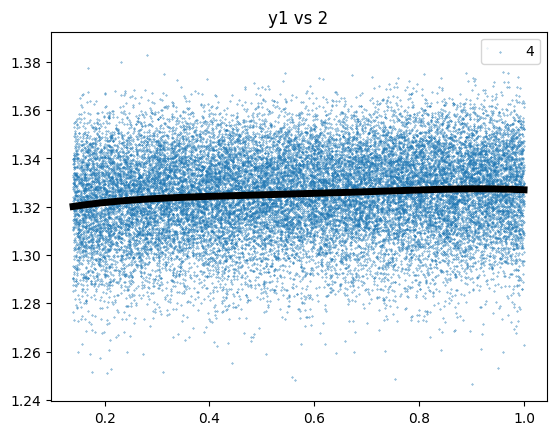

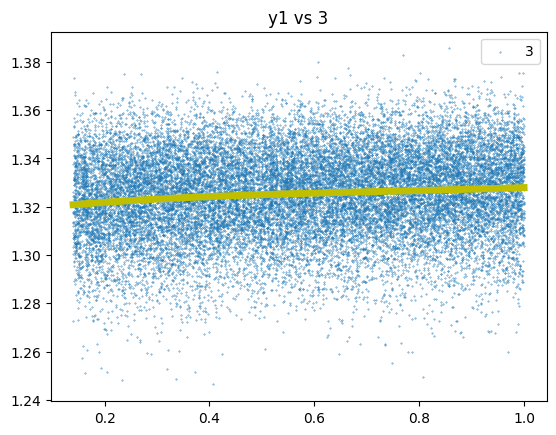

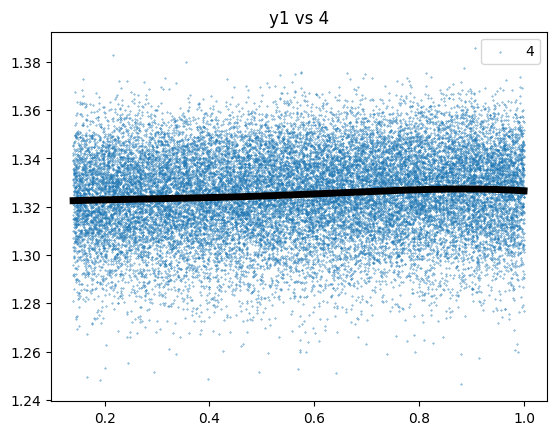

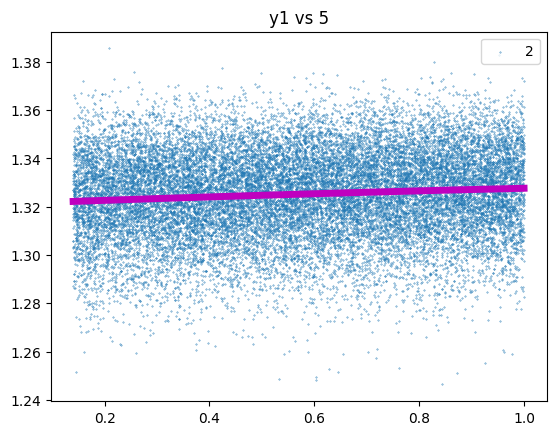

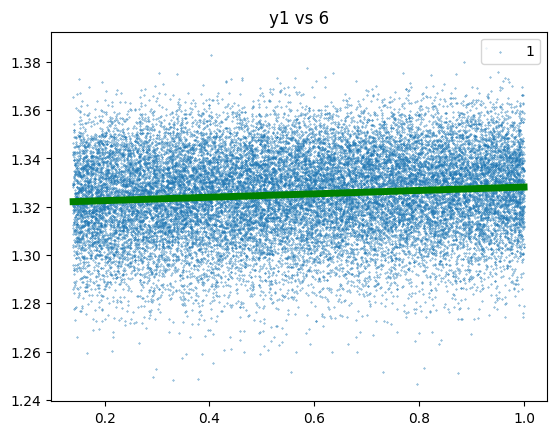

...

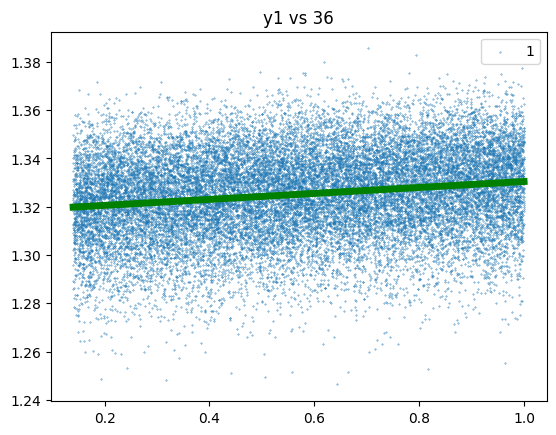

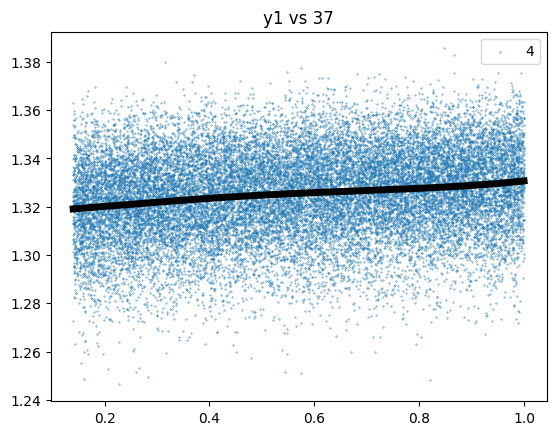

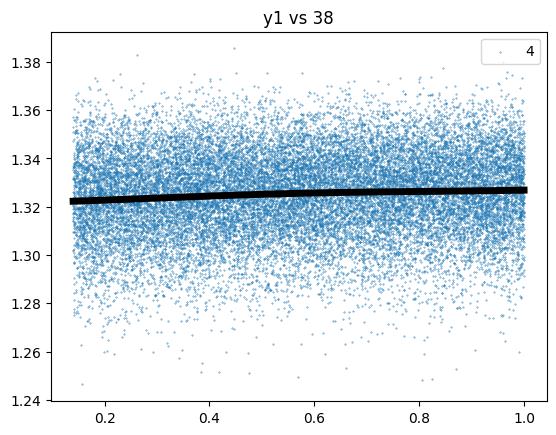

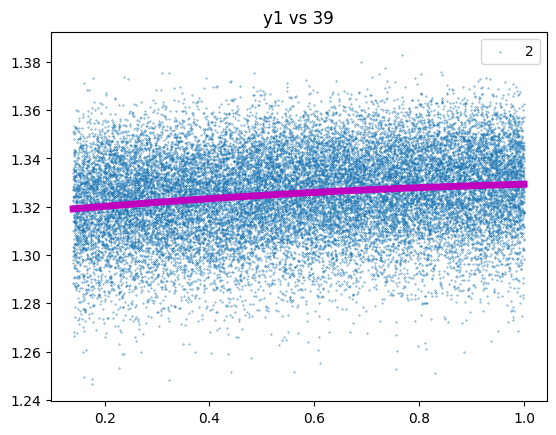

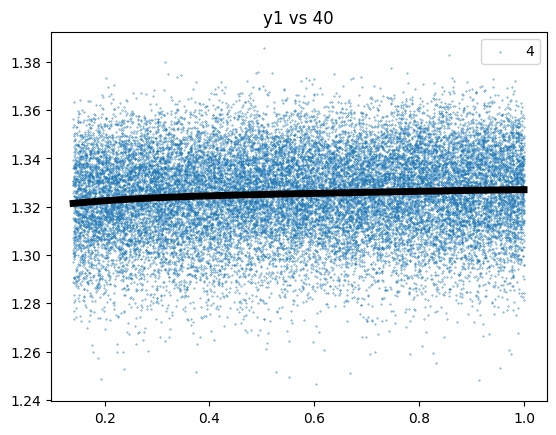

In [ ]:
degs1 = []
for i in X.columns:
  plt.scatter(X[i], y1, s=0.1)
  err1 = []
  for p in range(1,5):
    err1.append((np.mean(np.abs(np.poly1d(np.polyfit(X[i], y1, p))(X[i]) - y1)), p)) # Finding MAE for each polynomial of degrees (1,2,3,4)
  deg = min(err1, key=lambda x: x[0])[1]                                             # Choosing polynomial with least error
  degs1.append(deg)
  plt.plot(np.unique(X[i]), np.poly1d(np.polyfit(X[i], y1, deg))(np.unique(X[i])), color=['g', 'm', 'y', 'k'][deg-1], linewidth=5)
  plt.legend(f'Degree: {deg}', loc='upper right')
  plt.title(f'y1 vs {i}')
  plt.show()

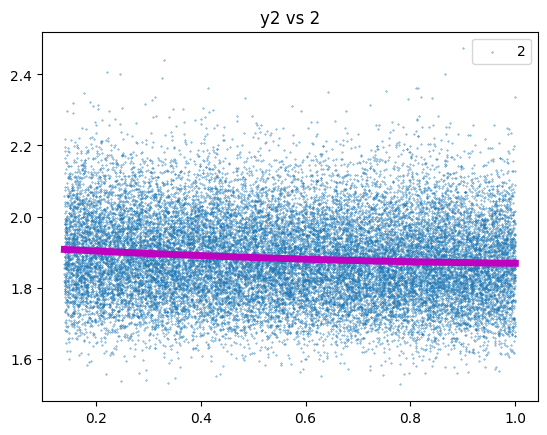

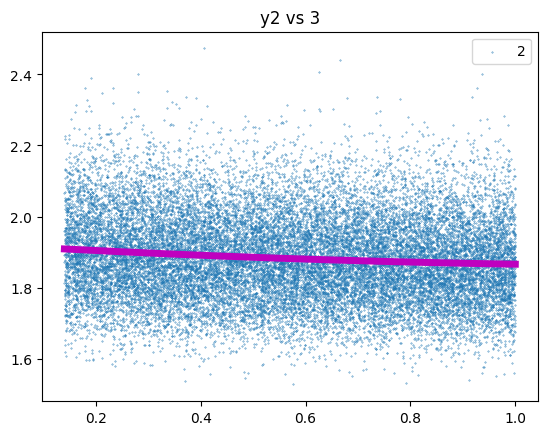

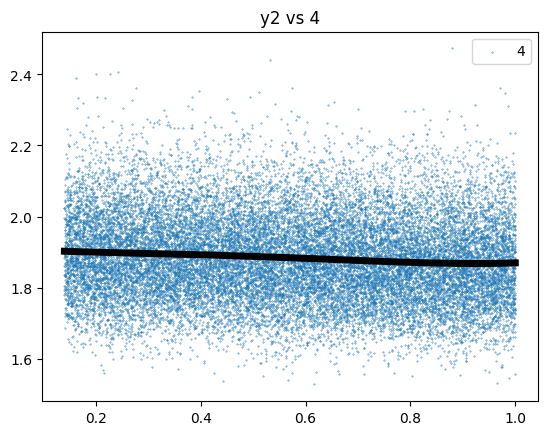

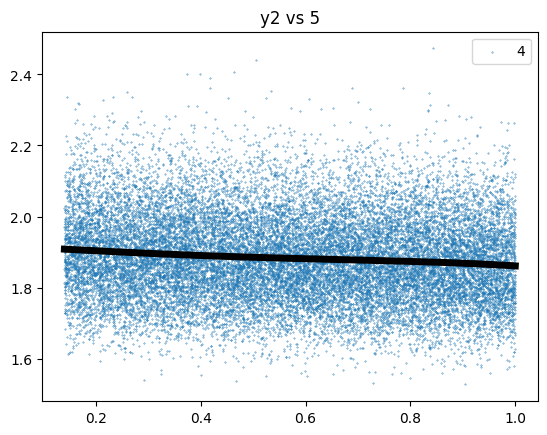

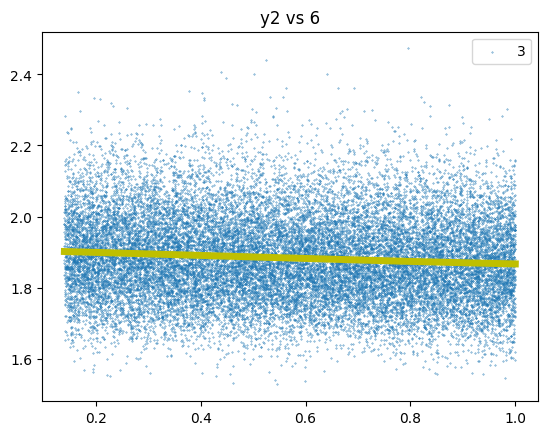

...

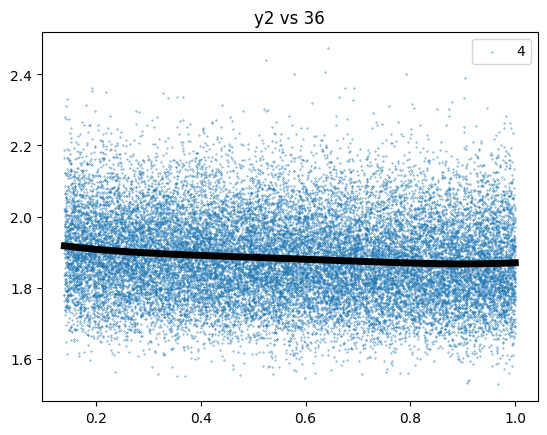

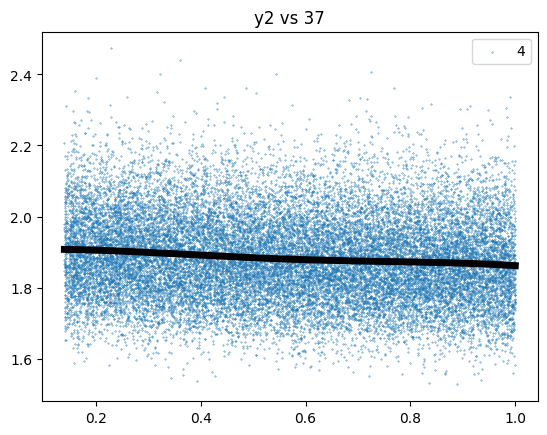

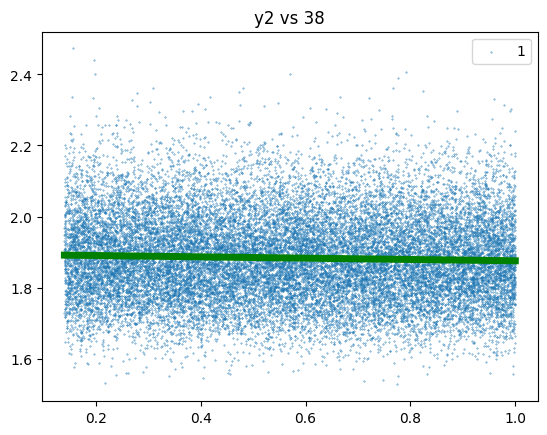

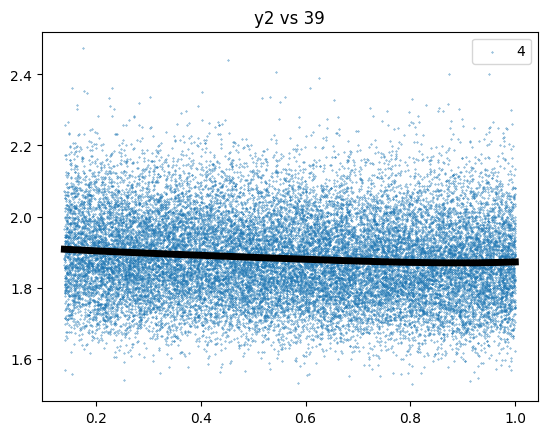

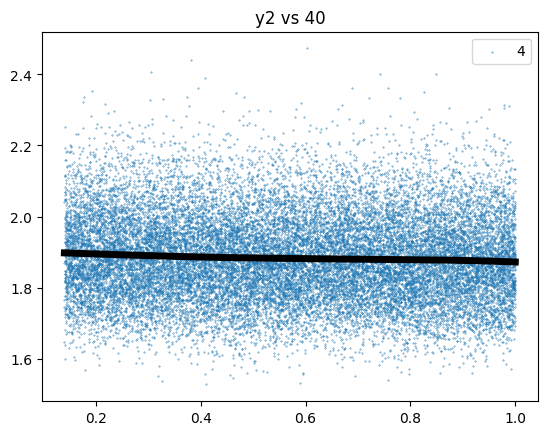

In [ ]:
degs2 = []
for i in X.columns:
  plt.scatter(X[i], y2, s=0.1)
  err2 = []
  for p in range(1,5):
    err2.append((np.mean(np.abs(np.poly1d(np.polyfit(X[i], y2, p))(X[i]) - y2)), p))
  deg = min(err2, key=lambda x: x[0])[1]
  degs2.append(deg)
  plt.plot(np.unique(X[i]), np.poly1d(np.polyfit(X[i], y2, deg))(np.unique(X[i])), color=['g', 'm', 'y', 'k'][deg-1], linewidth=5)
  plt.legend(str(deg), loc='upper right')
  plt.title(f'y2 vs {i}')
  plt.show()

### Extracting Corresponding Features

In [ ]:
X1 = pd.DataFrame()
for i, column in enumerate(X.columns):
  for p in range(1, degs1[i]+1):
    X1[f'{column}^{p}'] = X[column]**p
X1.head()

<ipython-input-12-5ed5eaa09898>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X1[f'{column}^{p}'] = X[column]**p
<ipython-input-12-5ed5eaa09898>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X1[f'{column}^{p}'] = X[column]**p
<ipython-input-12-5ed5eaa09898>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = fram

,2^1,2^2,2^3,2^4,3^1,3^2,3^3,4^1,4^2,4^3,...,38^1,38^2,38^3,38^4,39^1,39^2,40^1,40^2,40^3,40^4
0,0.712589,0.507783,0.361841,0.257844,0.222482,0.049498,0.011012,0.841678,0.708422,0.596263,...,0.573095,0.328438,0.188226,0.107872,0.954890,0.911815,0.707881,0.501096,0.354717,0.251097
1,0.470997,0.221838,0.104485,0.049212,0.209595,0.043930,0.009208,0.453830,0.205962,0.093471,...,0.936255,0.876573,0.820696,0.768380,0.643184,0.413685,0.794542,0.631297,0.501592,0.398536
2,0.607656,0.369245,0.224374,0.136342,0.943945,0.891032,0.841085,0.300479,0.090288,0.027130,...,0.275118,0.075690,0.020824,0.005729,0.872779,0.761743,0.597715,0.357263,0.213542,0.127637
3,0.882643,0.779058,0.687630,0.606931,0.444155,0.197274,0.087620,0.626596,0.392623,0.246016,...,0.169913,0.028871,0.004905,0.000834,0.501702,0.251705,0.182456,0.033290,0.006074,0.001108
4,0.558186,0.311571,0.173915,0.097077,0.159642,0.025486,0.004069,0.246369,0.060698,0.014954,...,0.274122,0.075143,0.020598,0.005646,0.153915,0.023690,0.279194,0.077950,0.021763,0.006076


In [ ]:
X2 = pd.DataFrame()
for i, column in enumerate(X.columns):
  for p in range(1, degs2[i]+1):
    X2[f'{column}^{p}'] = X[column]**p
X2.head()

<ipython-input-13-9070e1c55015>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X2[f'{column}^{p}'] = X[column]**p
<ipython-input-13-9070e1c55015>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X2[f'{column}^{p}'] = X[column]**p
<ipython-input-13-9070e1c55015>:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = fram

,2^1,2^2,3^1,3^2,4^1,4^2,4^3,4^4,5^1,5^2,...,37^4,38^1,39^1,39^2,39^3,39^4,40^1,40^2,40^3,40^4
0,0.712589,0.507783,0.222482,0.049498,0.841678,0.708422,0.596263,0.501862,0.282537,0.079827,...,0.095749,0.573095,0.954890,0.911815,0.870683,0.831406,0.707881,0.501096,0.354717,0.251097
1,0.470997,0.221838,0.209595,0.043930,0.453830,0.205962,0.093471,0.042420,0.927558,0.860364,...,0.268242,0.936255,0.643184,0.413685,0.266076,0.171136,0.794542,0.631297,0.501592,0.398536
2,0.607656,0.369245,0.943945,0.891032,0.300479,0.090288,0.027130,0.008152,0.728950,0.531367,...,0.609387,0.275118,0.872779,0.761743,0.664834,0.580253,0.597715,0.357263,0.213542,0.127637
3,0.882643,0.779058,0.444155,0.197274,0.626596,0.392623,0.246016,0.154152,0.265426,0.070451,...,0.323139,0.169913,0.501702,0.251705,0.126281,0.063355,0.182456,0.033290,0.006074,0.001108
4,0.558186,0.311571,0.159642,0.025486,0.246369,0.060698,0.014954,0.003684,0.395570,0.156476,...,0.436965,0.274122,0.153915,0.023690,0.003646,0.000561,0.279194,0.077950,0.021763,0.006076


# Training Linear Regression Model

In [ ]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2)

In [ ]:
lr1 = LinearRegression()
lr2 = LinearRegression()
lr1.fit(X1_train, y1_train)
lr2.fit(X2_train, y2_train)

LinearRegression()

### Verifying Model

In [ ]:
y1_pred = lr1.predict(X1_test)
print('Infinite Multiplication Factor - ')
print('MAE: ', np.mean(np.abs(y1_pred - y1_test)))
print('MSE: ', np.mean((y1_pred - y1_test)**2))
print('R2 Score: ', lr1.score(X1_test, y1_test))

Infinite Multiplication Factor - 
MAE:  0.0012135231991283058
MSE:  2.5857159295088056e-06


In [ ]:
y2_pred = lr2.predict(X2_test)
print('Pin Power Peaking Factor - ')
print('MAE: ', np.mean(np.abs(y2_pred - y2_test)))
print('MSE: ', np.mean((y2_pred - y2_test)**2))
print('R2 Score: ', lr2.score(X2_test, y2_test))

Pin Power Peaking Factor - 
MAE:  0.04506110368294176
MSE:  0.003404114672341117


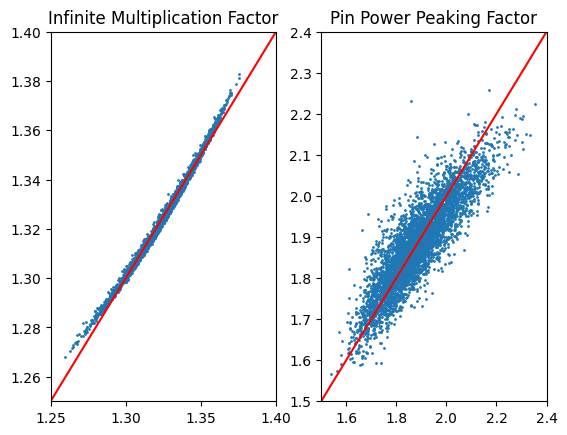

In [ ]:
plt.subplot(1,2,1)
plt.scatter(y1_test, y1_pred, s=1)
plt.xlim(1.25, 1.4)
plt.ylim(1.25, 1.4)
plt.plot([1.25,1.4], [1.25, 1.4], color='r')
plt.title('Infinite Multiplication Factor')
plt.subplot(1,2,2)
plt.scatter(y2_test, y2_pred, s=1)
plt.xlim(1.5, 2.4)
plt.ylim(1.5, 2.4)
plt.plot([1.5,2.4], [1.5, 2.4], color='r')
plt.title('Pin Power Peaking Factor')
plt.show()

### We can clearly see that most of the scatter plot lies on y=x

# Final Testing

In [ ]:
test = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/PClub - Spring Camp/ML/Lattice Physics/test.csv', header=None, dtype=str)
test.head()

,0
0,1.315260000 1.942942171 3.461677019 4.71511608...
1,1.325380000 1.875032824 4.695836519 3.29003266...
2,1.314470000 1.950208204 0.704499899 1.08765773...
3,1.333350000 1.861487153 1.489137135 4.17330751...
4,1.306650000 2.053154388 2.269667802 1.93977819...


In [ ]:
test[0] = [list(map(float, x.split())) for x in test[0]]
test = pd.DataFrame(test[0].tolist(), columns=[i for i in range(41)])
for i in range(2, 41):
  test[i] = test[i]/max(test[i])
test.head()

,0,1,2,3,4,5,6,7,8,9,...,31,32,33,34,35,36,37,38,39,40
0,1.31526,1.942942,0.694341,0.944309,0.594697,0.329987,0.864183,0.951795,0.279908,0.688436,...,0.726534,0.468878,0.988011,0.165466,0.344079,0.186142,0.694895,0.747336,0.257310,0.948174
1,1.32538,1.875033,0.941889,0.658904,0.417386,0.440280,0.750144,0.287180,0.394404,0.302929,...,0.310489,0.575374,0.317920,0.259198,0.734529,0.828722,0.946241,0.688797,0.995754,0.775637
2,1.31447,1.950208,0.141308,0.217828,0.645066,0.749552,0.439016,0.218758,0.562705,0.837469,...,0.510420,0.748990,0.220074,0.932211,0.332656,0.587939,0.162196,0.826666,0.492749,0.711991
3,1.33335,1.861487,0.298690,0.835800,0.904036,0.485623,0.275121,0.257524,0.564223,0.233914,...,0.650811,0.992942,0.356361,0.479462,0.370093,0.570380,0.909564,0.688000,0.871972,0.555474
4,1.30665,2.053154,0.455249,0.388485,0.773773,0.490415,0.360282,0.803646,0.926925,0.765655,...,0.779781,0.561136,0.329980,0.156373,0.388702,0.281841,0.178381,0.709628,0.183956,0.626617


In [ ]:
X_test = test.iloc[:, 2:]
y1_test = test.iloc[:, 0]
y2_test = test.iloc[:, 1]

X1_test = pd.DataFrame()
for i, column in enumerate(X_test.columns):
  for p in range(1, degs1[i]+1):
    X1_test[f'{column}^{p}'] = X_test[column]**p
print(X1_test.head())

X2_test = pd.DataFrame()
for i, column in enumerate(X_test.columns):
  for p in range(1, degs2[i]+1):
    X2_test[f'{column}^{p}'] = X_test[column]**p
print(X2_test.head())

        2^1       2^2       2^3       2^4       3^1       3^2       3^3  \
0  0.694341  0.482110  0.334749  0.232430  0.944309  0.891720  0.842059   
1  0.941889  0.887154  0.835600  0.787042  0.658904  0.434154  0.286066   
2  0.141308  0.019968  0.002822  0.000399  0.217828  0.047449  0.010336   
3  0.298690  0.089216  0.026648  0.007959  0.835800  0.698561  0.583857   
4  0.455249  0.207251  0.094351  0.042953  0.388485  0.150920  0.058630   

        4^1       4^2       4^3  ...      38^1      38^2      38^3      38^4  \
0  0.594697  0.353664  0.210323  ...  0.747336  0.558511  0.417396  0.311935   
1  0.417386  0.174211  0.072713  ...  0.688797  0.474441  0.326794  0.225095   
2  0.645066  0.416111  0.268419  ...  0.826666  0.683376  0.564924  0.467003   
3  0.904036  0.817281  0.738852  ...  0.688000  0.473344  0.325661  0.224055   
4  0.773773  0.598724  0.463276  ...  0.709628  0.503573  0.357349  0.253585   

       39^1      39^2      40^1      40^2      40^3      40^4  
0  0

<ipython-input-27-7f5e71e875c2>:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X1_test[f'{column}^{p}'] = X_test[column]**p
<ipython-input-27-7f5e71e875c2>:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  X1_test[f'{column}^{p}'] = X_test[column]**p
<ipython-input-27-7f5e71e875c2>:8: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, 

In [ ]:
y1_pred = lr1.predict(X1_test)
y2_pred = lr2.predict(X2_test)

print('MAE1: ', np.mean(np.abs(y1_pred - y1_test)))
print('MSE1: ', np.mean((y1_pred - y1_test)**2))
print('R2 Score1: ', lr1.score(X1_test, y1_test))
print()
print('MAE2: ', np.mean(np.abs(y2_pred - y2_test)))
print('MSE2: ', np.mean((y2_pred - y2_test)**2))
print('R2 Score2: ', lr2.score(X2_test, y2_test))

MAE1:  0.001238388303222649
MSE1:  3.912196977686287e-06
MAE2:  0.04702463439649607
MSE2:  0.0036200683712332995


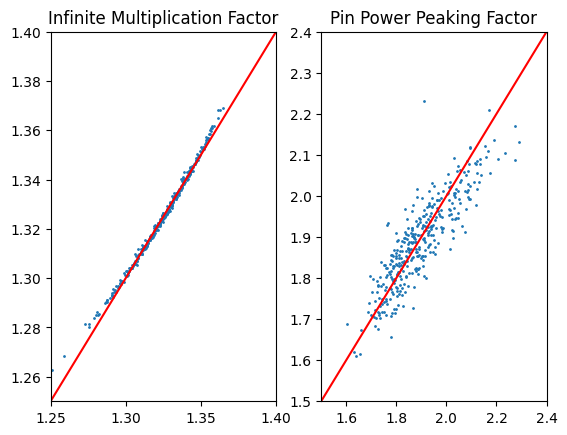

In [ ]:
plt.subplot(1,2,1)
plt.scatter(y1_test, y1_pred, s=1)
plt.xlim(1.25, 1.4)
plt.ylim(1.25, 1.4)
plt.plot([1.25,1.4], [1.25, 1.4], color='r')
plt.title('Infinite Multiplication Factor')
plt.subplot(1,2,2)
plt.scatter(y2_test, y2_pred, s=1)
plt.xlim(1.5, 2.4)
plt.ylim(1.5, 2.4)
plt.plot([1.5,2.4], [1.5, 2.4], color='r')
plt.title('Pin Power Peaking Factor')
plt.show()